# Feature Extraction: Version 3

In [1]:
import cv2
import os
import random
import matplotlib.pyplot as plt
import numpy as np

In [2]:
TRAIN_DIR = "../data/train"
CLASSES = ["Class A", "Class B", "Class C", "Class D"]

In [3]:
def extract_random_images(directory, class_name, num_images=3):
    class_path = os.path.join(directory, class_name)
    image_files = os.listdir(class_path)
    random_images = random.sample(image_files, num_images)
    images = []
    for img_file in random_images:
        img_path = os.path.join(class_path, img_file)
        img = cv2.imread(img_path)
        images.append(img)
    return images

In [4]:
num_images_per_class = 3
all_class_images = {}
for class_name in CLASSES:
    images = extract_random_images(TRAIN_DIR, class_name, num_images_per_class)
    all_class_images[class_name] = images

## Remove Background using Contours

In [5]:
def remove_background_contours(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray, 240, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    mask = np.zeros_like(image)
    cv2.drawContours(mask, contours, -1, (255, 255, 255), thickness=cv2.FILLED)
    result = cv2.bitwise_and(image, mask)
    return result

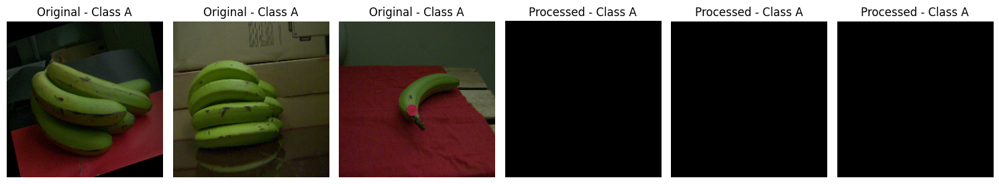

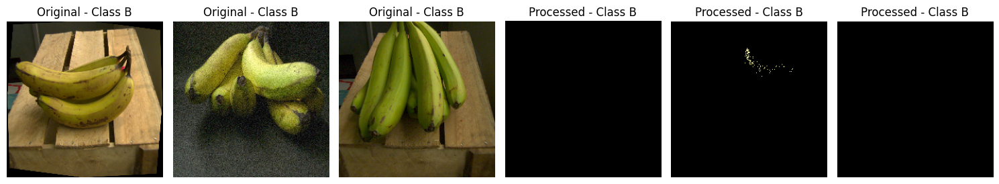

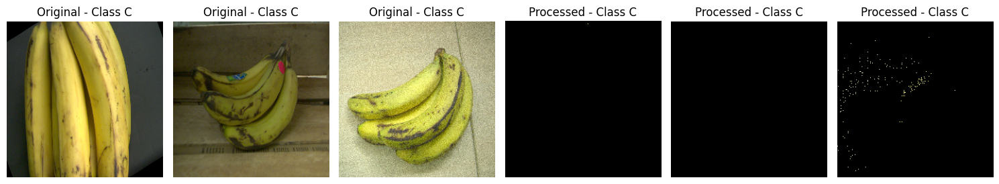

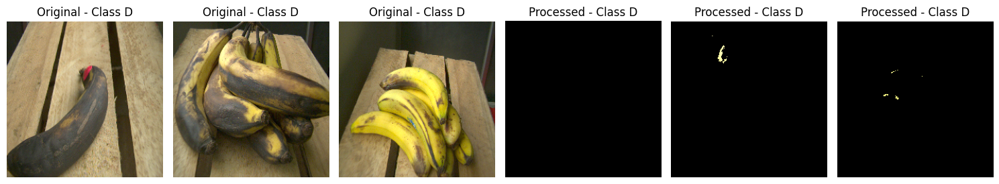

In [6]:
for class_name, images in all_class_images.items():
    fig, axs = plt.subplots(1, 6, figsize=(15, 5))

    for i, img in enumerate(images):
        processed_image = remove_background_contours(img)
        axs[i].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axs[i].set_title(f"Original - {class_name}")
        axs[i].axis("off")

        axs[i + len(images)].imshow(cv2.cvtColor(processed_image, cv2.COLOR_BGR2RGB))
        axs[i + len(images)].set_title(f"Processed - {class_name}")
        axs[i + len(images)].axis("off")

    plt.tight_layout()
    plt.show()

## Remove background via GrabCut

In [7]:
def remove_background_grabcut(image):
    mask = np.zeros(image.shape[:2], np.uint8)
    bgdModel = np.zeros((1, 65), np.float64)
    fgdModel = np.zeros((1, 65), np.float64)
    rect = (
        50,
        50,
        image.shape[1] - 50,
        image.shape[0] - 50,
    )

    cv2.grabCut(image, mask, rect, bgdModel, fgdModel, 5, cv2.GC_INIT_WITH_RECT)

    mask2 = np.where((mask == 2) | (mask == 0), 0, 1).astype("uint8")
    result = image * mask2[:, :, np.newaxis]
    return result

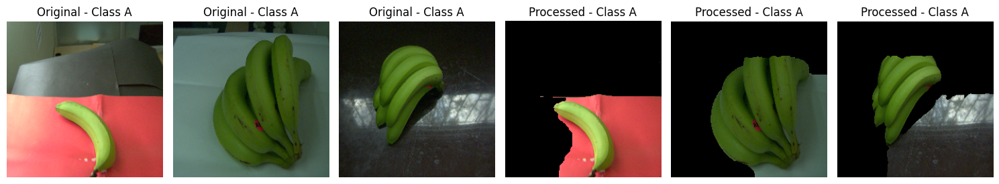

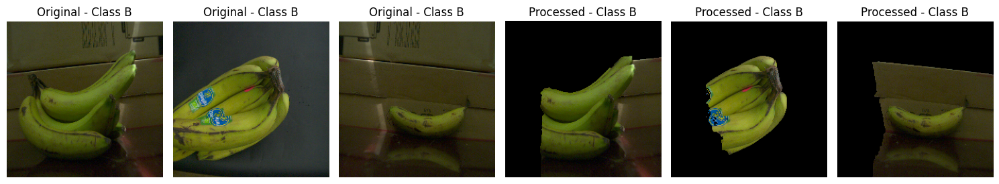

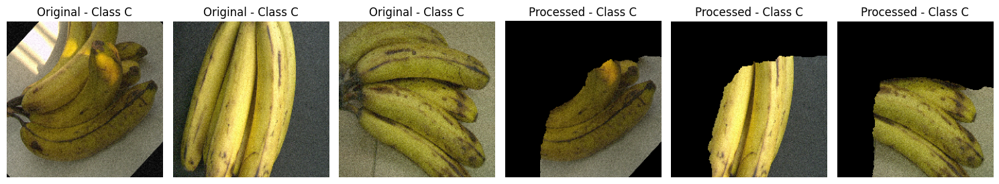

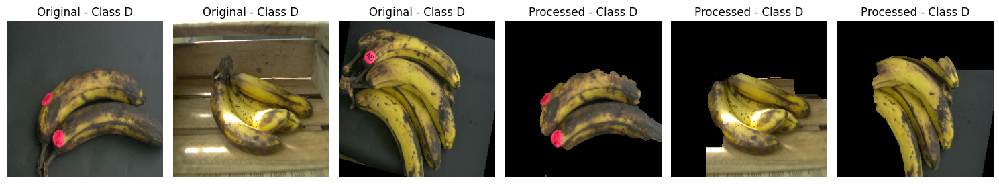

In [8]:
for class_name, images in all_class_images.items():
    fig, axs = plt.subplots(1, 6, figsize=(15, 5))

    for i, img in enumerate(images):
        processed_image = remove_background_grabcut(img)
        axs[i].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axs[i].set_title(f"Original - {class_name}")
        axs[i].axis("off")

        axs[i + len(images)].imshow(cv2.cvtColor(processed_image, cv2.COLOR_BGR2RGB))
        axs[i + len(images)].set_title(f"Processed - {class_name}")
        axs[i + len(images)].axis("off")

    plt.tight_layout()
    plt.show()

## Remove Background - Color Thresholding v2

In [9]:
color_ranges = {
    "Unripe": (np.array([20, 100, 100]), np.array([40, 255, 255])),
    "SemiRipe": (np.array([30, 80, 80]), np.array([50, 255, 255])),
    "Ripe": (np.array([40, 40, 40]), np.array([80, 255, 255])),
    "Overripe": (np.array([10, 60, 60]), np.array([30, 255, 200])),
}

In [10]:
def remove_background_color_thresholding(image, color_ranges):
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    final_mask = np.zeros_like(image)

    for color_name, (lower_bound, upper_bound) in color_ranges.items():
        mask = cv2.inRange(hsv, lower_bound, upper_bound)
        final_mask = cv2.bitwise_or(final_mask, cv2.merge([mask] * 3))

    result = cv2.bitwise_and(image, final_mask)
    return result

In [11]:
num_images_per_class = 3
all_class_images = {}
for class_name in CLASSES:
    images = extract_random_images(TRAIN_DIR, class_name, num_images_per_class)
    all_class_images[class_name] = images

--- Class: Class A ---


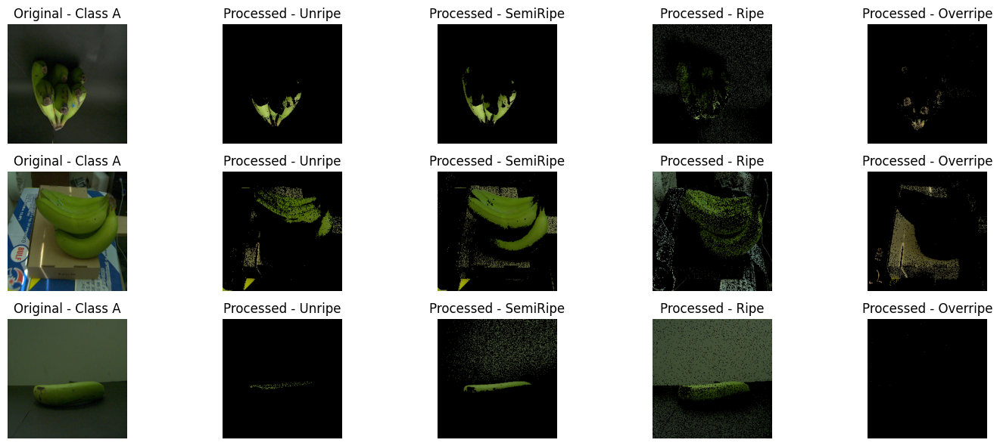

--- Class: Class B ---


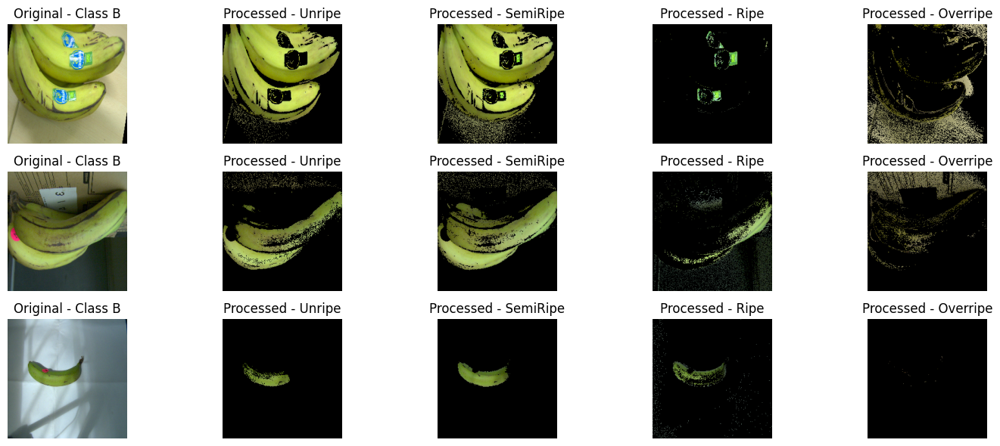

--- Class: Class C ---


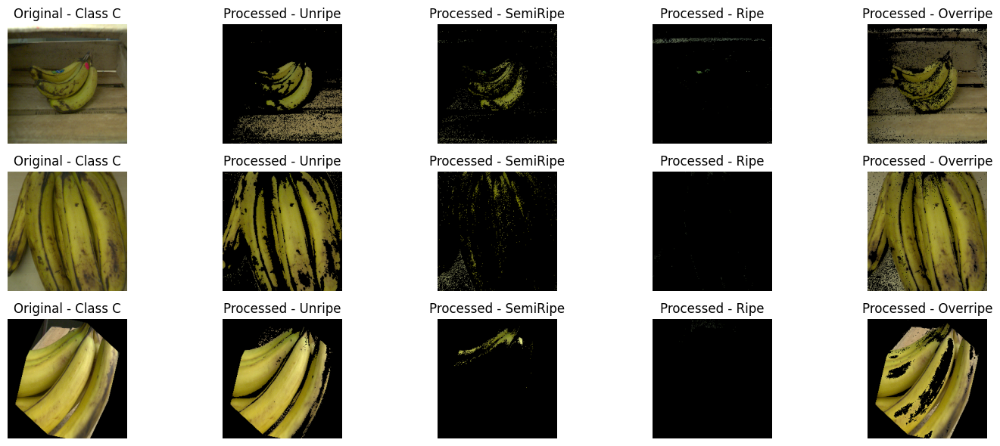

--- Class: Class D ---


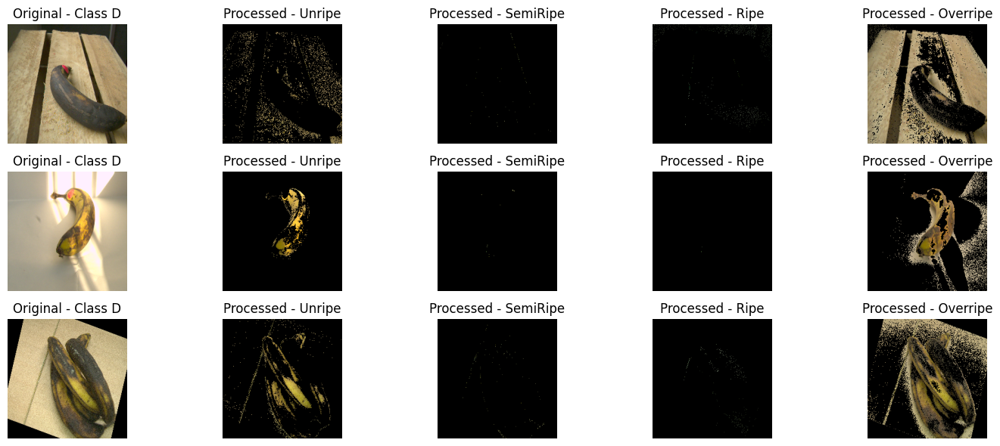

In [12]:
for class_name, images in all_class_images.items():
    fig, axs = plt.subplots(3, len(color_ranges) + 1, figsize=(15, 6))
    print(f"--- Class: {class_name} ---")
    for j, image in enumerate(images):
        axs[j, 0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        axs[j, 0].set_title(f"Original - {class_name}")
        axs[j, 0].axis("off")

        for i, (color_name, color_range) in enumerate(color_ranges.items()):
            processed_image = remove_background_color_thresholding(
                image, {color_name: color_range}
            )
            axs[j, i + 1].imshow(cv2.cvtColor(processed_image, cv2.COLOR_BGR2RGB))
            axs[j, i + 1].set_title(f"Processed - {color_name}")
            axs[j, i + 1].axis("off")

    plt.tight_layout()
    plt.show()

## Remove Background - Color Thresholding v3

In [13]:
def remove_background_color_thresholding(image, class_color_ranges):
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    final_mask = np.zeros_like(image)

    for color_name, (lower_bound, upper_bound) in class_color_ranges.items():
        mask = cv2.inRange(hsv, lower_bound, upper_bound)
        final_mask = cv2.bitwise_or(final_mask, cv2.merge([mask] * 3))

    result = cv2.bitwise_and(image, final_mask)
    return result

In [14]:
num_images_per_class = 3
all_class_images = {}
for class_name in CLASSES:
    images = extract_random_images(TRAIN_DIR, class_name, num_images_per_class)
    all_class_images[class_name] = images

In [15]:
color_ranges = {
    "Class A": {  # 1 - 6 days
        "Yellow": (
            np.array([0, 50, 50]),
            np.array([100, 255, 255]),
        ),
        "Green": (
            np.array([0, 40, 40]),
            np.array([100, 255, 255]),
        ),
    },
    "Class B": {  # 7 - 14 days
        "Yellow": (
            np.array([0, 50, 50]),
            np.array([100, 255, 255]),
        ),
        "Green": (np.array([0, 40, 40]), np.array([100, 255, 255])),
    },
    "Class C": {  # 15 - 22 days
        "Yellow": (np.array([0, 50, 50]), np.array([60, 255, 255])),
        "Green": (np.array([0, 40, 40]), np.array([100, 255, 255])),
        "Brown": (np.array([20, 60, 60]), np.array([50, 255, 200])),
    },
    "Class D": {  # 23 - 28 days
        "Yellow": (
            np.array([0, 50, 50]),
            np.array([100, 255, 255]),
        ),
        "Green": (np.array([30, 40, 40]), np.array([120, 255, 255])),
        "Brown": (
            np.array([20, 30, 30]),
            np.array([90, 255, 255]),
        ),
    },
}

--- Class: Class A ---


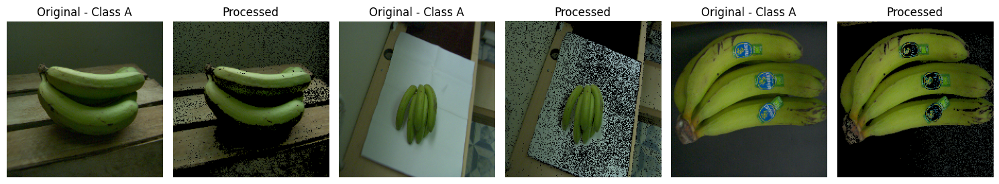

--- Class: Class B ---


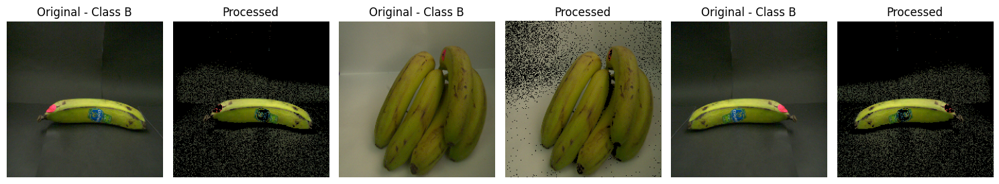

--- Class: Class C ---


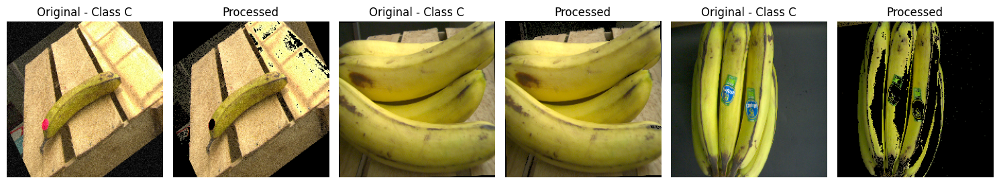

--- Class: Class D ---


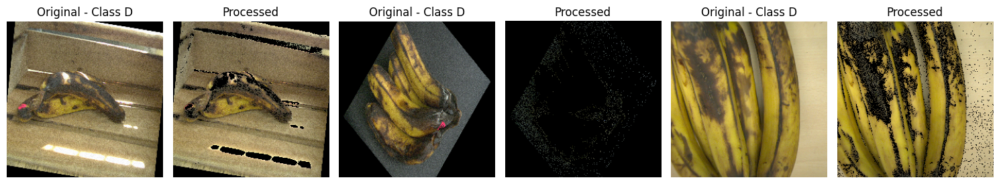

In [16]:
for class_name, images in all_class_images.items():
    num_images = len(images)
    fig, axs = plt.subplots(1, num_images * 2, figsize=(15, 6))
    print(f"--- Class: {class_name} ---")
    class_color_ranges = color_ranges[class_name]

    for j, (image, color_range) in enumerate(
        zip(images, list(class_color_ranges.values()) * num_images)
    ):
        axs[j * 2].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        axs[j * 2].set_title(f"Original - {class_name}")
        axs[j * 2].axis("off")

        processed_image = remove_background_color_thresholding(
            image, {class_name: color_range}
        )
        axs[j * 2 + 1].imshow(cv2.cvtColor(processed_image, cv2.COLOR_BGR2RGB))
        axs[j * 2 + 1].set_title(f"Processed")
        axs[j * 2 + 1].axis("off")

    plt.tight_layout()
    plt.show()

## Remove Background - Adaptive Thresholding

In [17]:
def remove_background_with_threshold(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    mask = cv2.adaptiveThreshold(
        gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2
    )
    mask = cv2.bitwise_not(mask)
    alpha = cv2.merge([mask] * 3)
    result = cv2.bitwise_and(image, alpha)
    return result

In [18]:
num_images_per_class = 3
all_class_images = {}
for class_name in CLASSES:
    images = extract_random_images(TRAIN_DIR, class_name, num_images_per_class)
    all_class_images[class_name] = images

--- Class: Class A ---


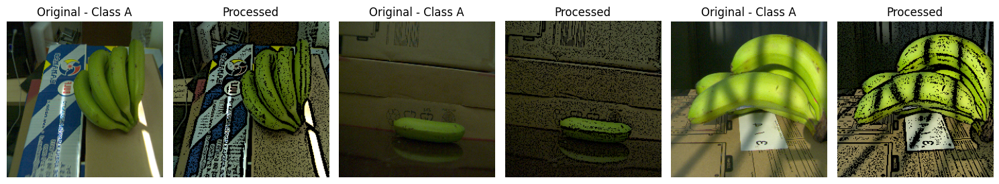

--- Class: Class B ---


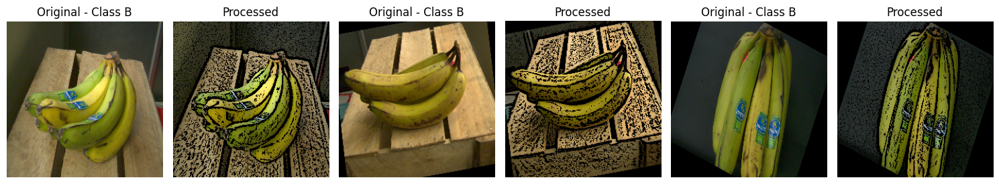

--- Class: Class C ---


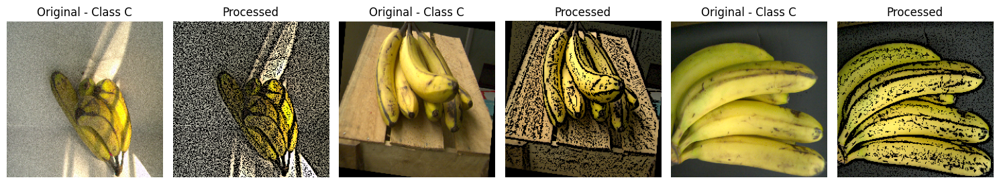

--- Class: Class D ---


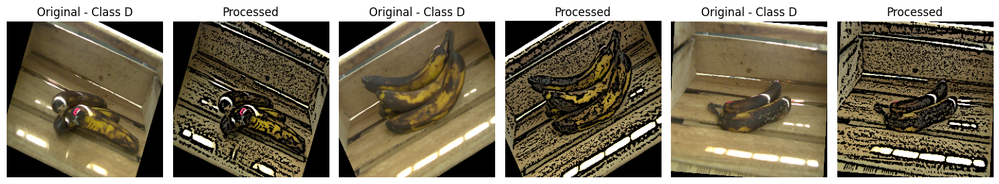

In [19]:
for class_name, images in all_class_images.items():
    num_images = len(images)
    fig, axs = plt.subplots(1, num_images * 2, figsize=(15, 6))
    print(f"--- Class: {class_name} ---")

    for j, image in enumerate(images):
        axs[j * 2].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        axs[j * 2].set_title(f"Original - {class_name}")
        axs[j * 2].axis("off")

        processed_image = remove_background_with_threshold(image)

        # Display the processed image using matplotlib
        axs[j * 2 + 1].imshow(cv2.cvtColor(processed_image, cv2.COLOR_BGR2RGB))
        axs[j * 2 + 1].set_title(f"Processed")
        axs[j * 2 + 1].axis("off")

    plt.tight_layout()
    plt.show()